 # Case Study : eICU Dataset

## Background

The eICU Collaborative Research Database is a multi-center database comprising deidentified health data associated with over 200,000 admissions to ICUs across the United States between 2014-2015. The database includes vital sign measurements, care plan documentation, severity of illness measures, diagnosis information, and treatment information. Data is collected through the Philips eICU program, a critical care telehealth program that delivers information to caregivers at the bedside. 

This project is a comprehensive study on the eICU dataset, focusing on data extraction, cleaning, and exploratory data analysis. The final goal is to identify and implement a feature selection method that can be applied to the dataset for further ML modeling.

#### Dataset Access

The eICU Collaborative Research Database (eICU-CRD) is a freely available dataset provided by the MIT Laboratory for Computational Physiology. The dataset contains high-granularity data from ICU patients across multiple hospitals.

- **eICU Data:** 
  - [eICU-CRD Website](https://eicu-crd.mit.edu/about/eicu/)
  - [eICU GitHub Repository](https://github.com/mit-lcp/eicu-code)

#### Data Extraction Process

The first step in this project was to identify and extract the relevant datasets from the eICU database. To determine which datasets to extract, I referred to the following resource:

- **Excel Sheet Reference:** 
  - [Study Link](https://www.mdpi.com/2075-4426/11/9/934)

Based on the findings in this study, I selected datasets that were most relevant to my exploratory analysis and future ML tasks.

#### Data Cleaning

After extracting the datasets, I performed the following data cleaning steps:

- **Handling Missing Values:** 
  - Missing values were identified and handled appropriately, either by imputation or removal depending on the percentage of missing data.
  
- **Data Normalization:** 
  - Continuous variables were normalized to ensure that all features are on a similar scale.
  
- **Outlier Detection:** 
  - Outliers were detected and managed through various statistical methods, ensuring they do not skew the analysis.
  
- **Categorical Variable Encoding:** 
  - Categorical variables were encoded using one-hot encoding or label encoding based on the variable type and model requirements.

#### Exploratory Analysis

An exploratory analysis was conducted to better understand the structure, relationships, and distributions within the dataset. This included:

- **Descriptive Statistics:** Summary statistics for continuous and categorical variables.
- **Correlation Analysis:** Identifying relationships between variables.
- **Visualization:** Creating histograms, scatter plots, and correlation heatmaps to visualize data distributions and relationships.


# Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import entropy
from scipy.stats import chi2
import plotly.express as px

In [2]:
raw_df = pd.read_csv("eICU_24hours_revised.csv")

In [3]:
raw_df.head(30)

,PATIENTUNITSTAYID,UNIQUEPID,AGE,GENDER,ETHNICITY,UNITDISCHARGESTATUS,LAB_8HOURS,ALBUMIN,BUN,TOTALBILIRUBIN,...,SODIUM,WBCCOUNT,VITAL_HOURS,VITAL_HEARTRATE,VITAL_RESPIRATION,VITAL_SAO2,VITAL_TEMPERATURE,VITAL_SYSTEMIC_SYSTOLIC,VITAL_SYSTEMIC_DIASTOLIC,VITAL_SYSTEMIC_MEAN
0,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,19.0,81.0,21.5,92.5,NaN,85.0,37.5,53.5
1,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,6.0,115.5,23.0,88.0,NaN,104.5,51.5,71.5
2,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,0.0,71.0,14.0,93.0,NaN,96.0,46.0,65.0
3,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,11.0,97.5,19.5,90.0,NaN,74.5,39.5,51.0
4,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,20.0,75.5,21.0,96.0,NaN,79.5,36.5,51.5
5,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,13.0,92.0,18.0,93.0,NaN,71.5,33.0,46.5
6,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,9.0,98.0,19.0,92.0,NaN,70.0,31.0,44.0
7,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,18.0,73.0,17.0,92.0,NaN,73.0,37.0,50.0
8,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,7.0,128.0,27.5,88.5,NaN,105.5,51.0,72.5
9,2257349,021-249916,> 89,Male,NaN,Alive,1.0,NaN,25.0,23.0,...,138.0,23.2,1.0,74.0,13.0,93.5,NaN,100.0,46.0,66.0


In [4]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2002029 entries, 0 to 2002028
Data columns (total 30 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   PATIENTUNITSTAYID         int64  
 1   UNIQUEPID                 object 
 2   AGE                       object 
 3   GENDER                    object 
 4   ETHNICITY                 object 
 5   UNITDISCHARGESTATUS       object 
 6   LAB_8HOURS                float64
 7   ALBUMIN                   float64
 8   BUN                       float64
 9   TOTALBILIRUBIN            float64
 10  LACTATE                   float64
 11  BICARBONATE               float64
 12  CHLORIDE                  float64
 13  CREATININE                float64
 14  GLUCOSE                   float64
 15  HEMOGLOBIN                float64
 16  HEMATOCRIT                float64
 17  PLATELETCOUNT             float64
 18  POTASSIUM                 float64
 19  PTT                       float64
 20  SODIUM                  

In [5]:
raw_df[raw_df['UNITDISCHARGESTATUS'] =='Alive'].describe().T

,count,mean,std,min,25%,50%,75%,max
PATIENTUNITSTAYID,1836320.0,1.821864e+06,977502.824033,141233.00,1063650.000,1716722.00,2773016.00,3353190.00
LAB_8HOURS,1832700.0,8.098429e-01,0.801971,0.00,0.000,1.00,1.00,2.00
ALBUMIN,836932.0,3.024546e+00,0.714837,0.40,2.500,3.00,3.50,5.70
BUN,1407696.0,2.382507e+01,5.166149,3.00,21.000,24.00,27.00,63.00
TOTALBILIRUBIN,1482024.0,2.844705e+01,23.366748,1.00,14.000,21.00,35.00,292.50
LACTATE,1489852.0,1.040999e+02,7.264179,58.00,100.000,104.00,108.00,151.00
BICARBONATE,1487592.0,1.631430e+00,1.739738,0.10,0.790,1.08,1.71,40.38
CHLORIDE,1490335.0,1.493133e+02,74.021693,14.00,108.000,131.00,166.00,1964.00
CREATININE,1491926.0,3.330030e+01,7.124183,7.40,28.000,33.00,38.30,66.10
GLUCOSE,1497979.0,1.101072e+01,2.411283,2.50,9.200,10.90,12.70,22.80


In [6]:
raw_df[raw_df['UNITDISCHARGESTATUS'] =='Expired'].describe().T

,count,mean,std,min,25%,50%,75%,max
PATIENTUNITSTAYID,165637.0,1.875447e+06,975251.133724,143056.000,1057733.00,1707267.00,2866028.000,3352827.00
LAB_8HOURS,165515.0,8.711355e-01,0.813360,0.000,0.00,1.00,2.000,2.00
ALBUMIN,82552.0,2.727028e+00,0.711621,0.200,2.20,2.70,3.200,5.50
BUN,131581.0,2.256487e+01,5.616398,4.000,19.00,22.00,26.000,51.00
TOTALBILIRUBIN,137627.0,3.462372e+01,24.672793,2.000,18.00,28.00,44.000,233.00
LACTATE,138147.0,1.043977e+02,7.731647,72.000,99.50,104.50,109.000,146.00
BICARBONATE,137492.0,1.889673e+00,1.644995,0.100,0.90,1.38,2.250,25.65
CHLORIDE,138639.0,1.616686e+02,81.518815,11.000,112.00,140.00,187.000,1165.00
CREATININE,131162.0,3.304997e+01,7.207123,12.900,27.65,32.40,38.000,68.00
GLUCOSE,132111.0,1.084988e+01,2.396651,4.300,9.00,10.60,12.400,23.30


In [7]:
raw_df.columns

Index(['PATIENTUNITSTAYID', 'UNIQUEPID', 'AGE', 'GENDER', 'ETHNICITY',
       'UNITDISCHARGESTATUS', 'LAB_8HOURS', 'ALBUMIN', 'BUN', 'TOTALBILIRUBIN',
       'LACTATE', 'BICARBONATE', 'CHLORIDE', 'CREATININE', 'GLUCOSE',
       'HEMOGLOBIN', 'HEMATOCRIT', 'PLATELETCOUNT', 'POTASSIUM', 'PTT',
       'SODIUM', 'WBCCOUNT', 'VITAL_HOURS', 'VITAL_HEARTRATE',
       'VITAL_RESPIRATION', 'VITAL_SAO2', 'VITAL_TEMPERATURE',
       'VITAL_SYSTEMIC_SYSTOLIC', 'VITAL_SYSTEMIC_DIASTOLIC',
       'VITAL_SYSTEMIC_MEAN'],
      dtype='object')

In [8]:
cat_cols =[ 'GENDER', 'ETHNICITY']

num_cols = ['LAB_8HOURS','AGE','ALBUMIN', 'BUN', 'TOTALBILIRUBIN',
       'LACTATE', 'BICARBONATE', 'CHLORIDE', 'CREATININE','VITAL_HOURS',
       'GLUCOSE', 'HEMOGLOBIN', 'HEMATOCRIT', 'PLATELETCOUNT', 'POTASSIUM',
       'PTT', 'SODIUM', 'WBCCOUNT','VITAL_HEARTRATE',
       'VITAL_RESPIRATION', 'VITAL_SAO2', 'VITAL_TEMPERATURE',
       'VITAL_SYSTEMIC_SYSTOLIC', 'VITAL_SYSTEMIC_DIASTOLIC',
       'VITAL_SYSTEMIC_MEAN']

# EDA

## Target variable

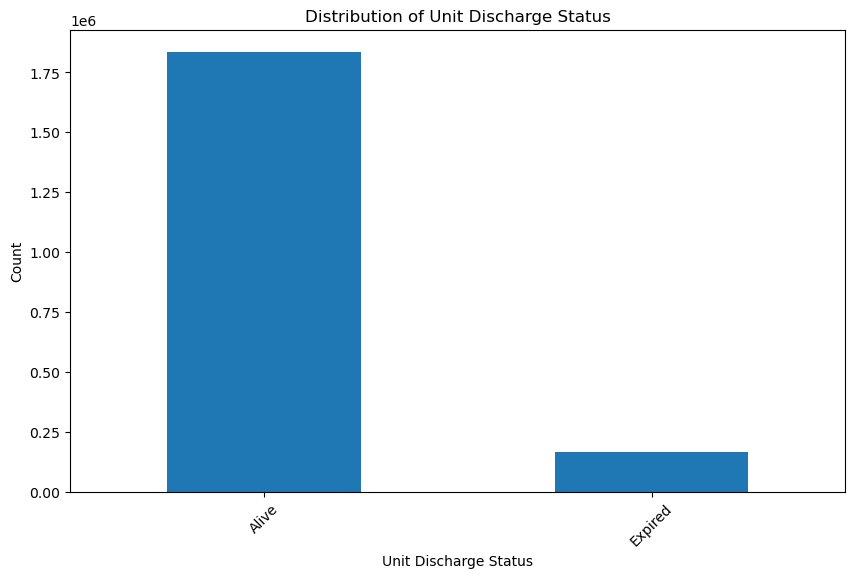

In [11]:
unit_discharge_status_counts = raw_df['UNITDISCHARGESTATUS'].value_counts(dropna=True)

# Plot the bar chart
plt.figure(figsize=(10, 6))
unit_discharge_status_counts.plot(kind='bar')
plt.xlabel('Unit Discharge Status')
plt.ylabel('Count')
plt.title('Distribution of Unit Discharge Status')
plt.xticks(rotation=45)
plt.show()

## Categorical variables

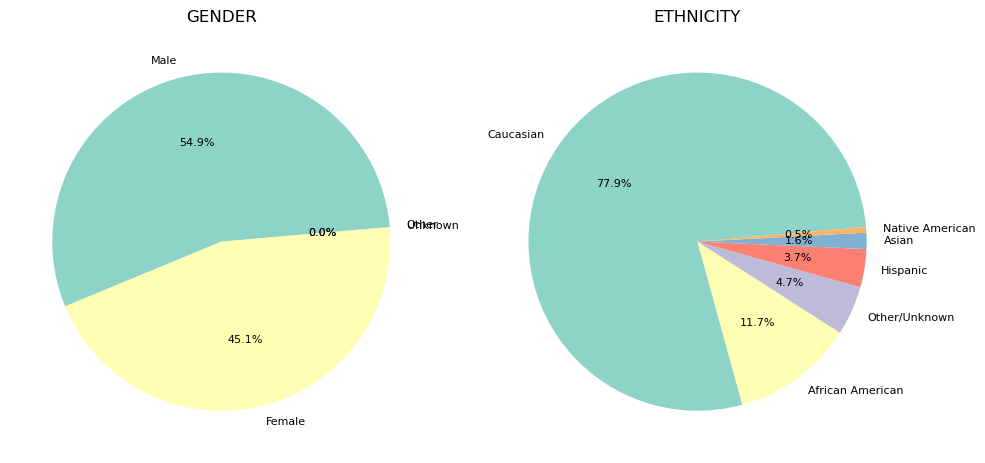

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))

axes = axes.flatten()

# pie chart
for i, col in enumerate(cat_cols):
    # count of each category
    counts = raw_df[col].value_counts()
    
    axes[i].pie(counts, labels=counts.index, 
                autopct='%1.1f%%', textprops={'fontsize': 8},
                startangle=5, colors=sns.color_palette('Set3'))
    axes[i].set_title(col)

plt.tight_layout()
plt.show()

In [14]:
raw_df['GENDER'].value_counts(dropna=False)
# Replace 'Unknown' and 'Other' values with mode
raw_df['GENDER'].replace(['Unknown', 'Other'], raw_df['GENDER'].mode()[0], inplace=True)

C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\2052548999.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  raw_df['GENDER'].replace(['Unknown', 'Other'], raw_df['GENDER'].mode()[0], inplace=True)


In [15]:
raw_df['ETHNICITY'].value_counts(dropna=False)

raw_df['ETHNICITY'].value_counts(dropna=False) / len(raw_df['ETHNICITY'])

ETHNICITY
Caucasian           0.771173
African American    0.115601
Other/Unknown       0.046606
Hispanic            0.036148
Asian               0.015361
NaN                 0.009789
Native American     0.005323
Name: count, dtype: float64

In [16]:
raw_df['ETHNICITY'] = raw_df['ETHNICITY'].replace({
    'African American': 'American',
    'Native American': 'American',
    'Other/Unknown': 'Others',
    'Hispanic': 'Others',
    'Asian': 'Others',
    np.nan : 'Others'
})

## Numerical variables

##### Age

In [19]:
raw_df['AGE'].value_counts()



AGE
> 89    68791
67      52701
72      52057
71      49858
68      49831
        ...  
17       1618
16        425
15        236
14         48
11         24
Name: count, Length: 78, dtype: int64

In [20]:
# Replace '>89' with 90
raw_df['AGE'] = raw_df['AGE'].str.replace('> 89', '90').astype(int)

#### Histogram

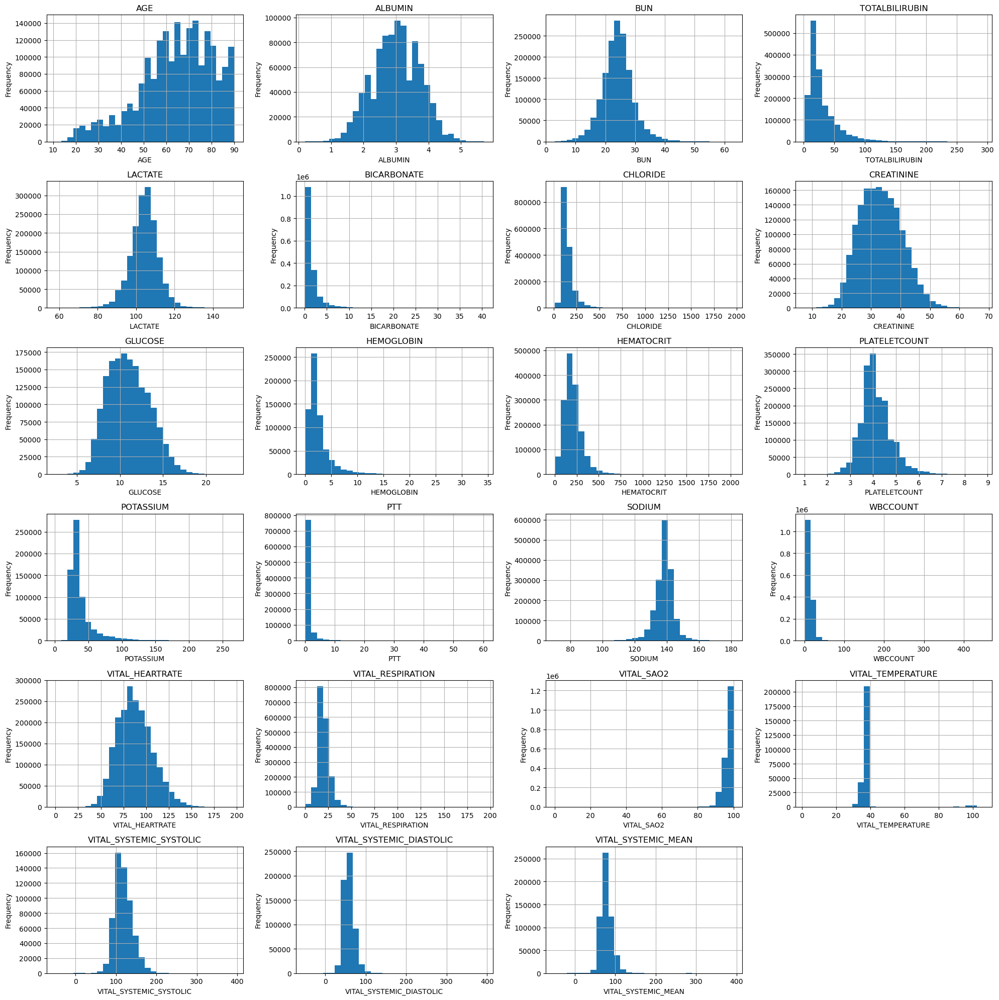

In [22]:
# Plot histograms
plt.figure(figsize=(20, 20))
num_cols_re = num_cols.copy()
num_cols_re.remove('VITAL_HOURS')
num_cols_re.remove('LAB_8HOURS')
for i, col in enumerate(num_cols_re, 1):
    plt.subplot(6, 4, i)  # Adjust the number of rows and columns as needed
    raw_df[col].dropna().hist(bins=30)  # Drop NaN values for histogram
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('histograms_with_hue.png')
plt.show()



In [23]:
cols_to_fill_mean = ['ALBUMIN', 'BUN', 'LACTATE', 'CREATININE', 'PLATELETCOUNT', 'SODIUM',
                     'VITAL_SYSTEMIC_SYSTOLIC']

#### Pair plots

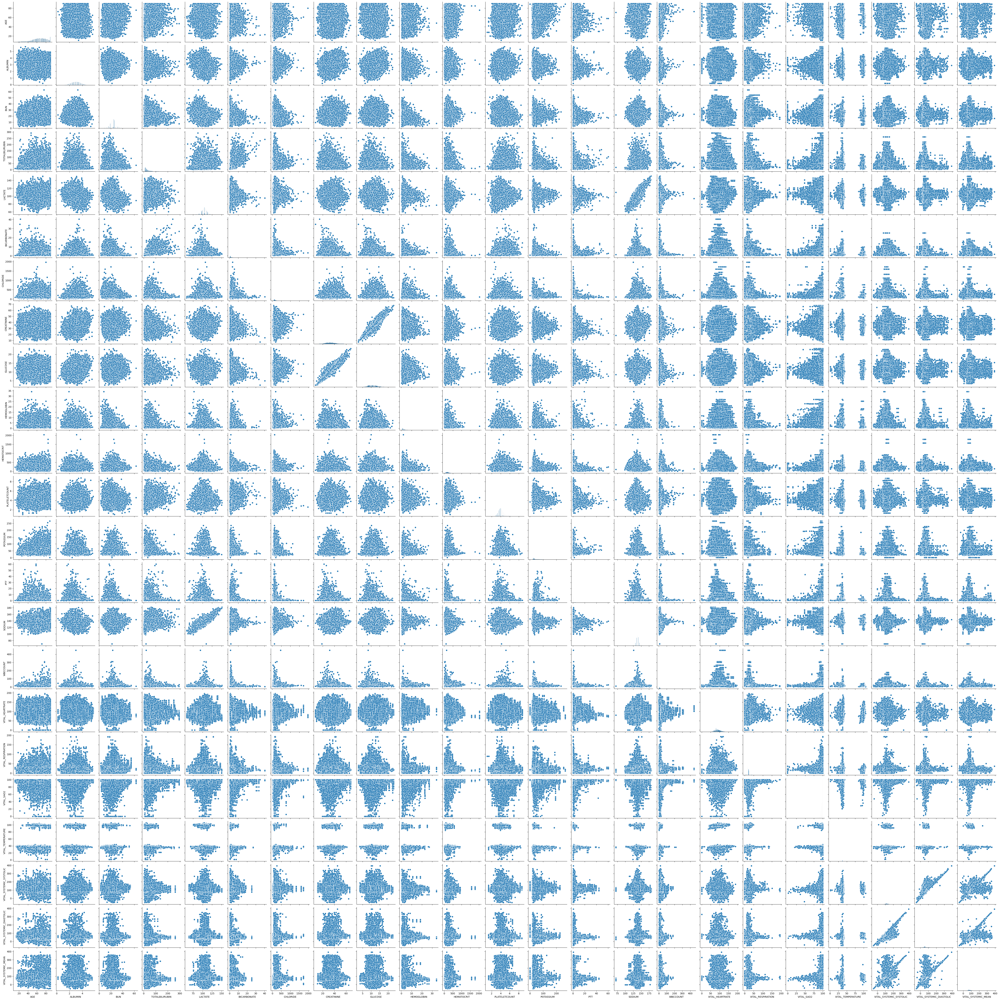

In [25]:


# Create pair plots with hue set to UNITDISCHARGESTATUS
sns.pairplot(raw_df[num_cols_re], diag_kind='hist')
plt.show()

In [26]:
#Compute the correlation matrix
corr_matrix = raw_df[num_cols].corr()

# Get columns with correlation >= 0.7 or <= -0.7
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.7:
            colname1 = corr_matrix.columns[i]
            colname2 = corr_matrix.index[j]
            high_corr_pairs.append((colname1, colname2, corr_matrix.iloc[i, j]))

# Print high correlation pairs
high_corr_pairs

[('GLUCOSE', 'CREATININE', 0.9745052727092023),
 ('SODIUM', 'LACTATE', 0.7637948190705534),
 ('VITAL_SYSTEMIC_MEAN', 'VITAL_SYSTEMIC_DIASTOLIC', 0.8142669485917414)]

#### Box plot to check outliers

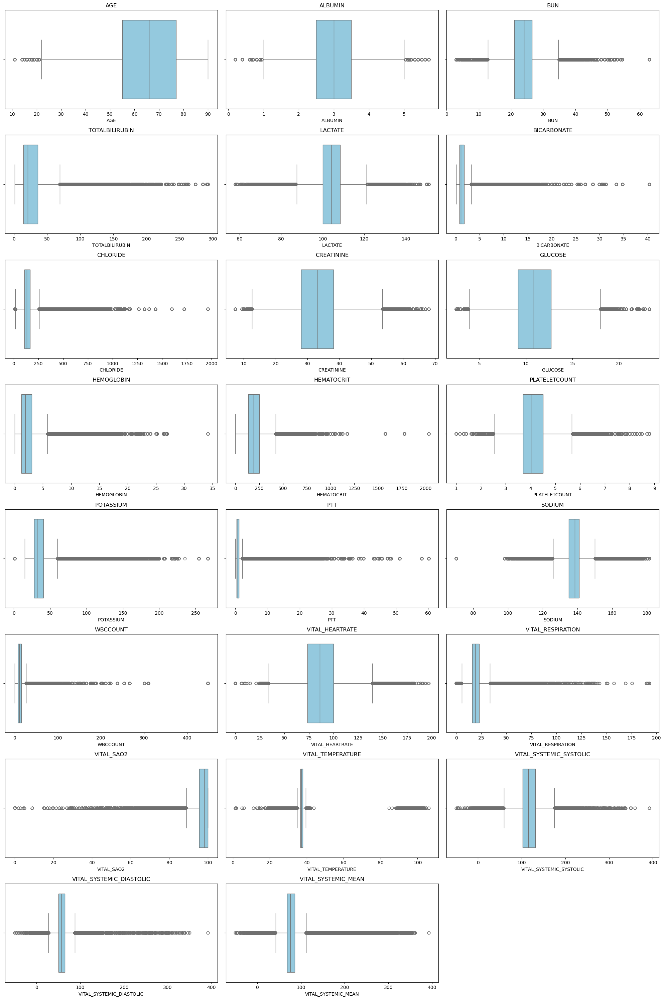

In [28]:
# Create box plots for each numerical column
plt.figure(figsize=(20, 30))  # Adjust the figure size as needed

for i, col in enumerate(num_cols_re):
    plt.subplot(len(num_cols_re) // 3 + 1, 3, i + 1)
    sns.boxplot(x=raw_df[col], color='skyblue')
    plt.title(col)

plt.tight_layout()
plt.show()

#### VIF

In [30]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [31]:
# Convert columns to numeric, coerce errors to NaN
X_num = raw_df[num_cols_re].apply(pd.to_numeric, errors='coerce')

# Drop rows with NaN values
X_num = X_num.dropna()

X_num = sm.add_constant(X_num)

# Calculate VIF
vif = pd.DataFrame()
vif["Features"] = X_num.columns
vif["VIF"] = [variance_inflation_factor(X_num.values, i) for i in range(X_num.shape[1])]

# Print VIF values
print(vif)

                    Features          VIF
0                      const  2044.773495
1                        AGE     1.280492
2                    ALBUMIN     1.294958
3                        BUN     2.290313
4             TOTALBILIRUBIN     2.335583
5                    LACTATE     3.994205
6                BICARBONATE     2.116964
7                   CHLORIDE     1.334276
8                 CREATININE    10.382692
9                    GLUCOSE    10.199563
10                HEMOGLOBIN     1.888859
11                HEMATOCRIT     1.325013
12             PLATELETCOUNT     1.181388
13                 POTASSIUM     1.143793
14                       PTT     1.229694
15                    SODIUM     3.198211
16                  WBCCOUNT     1.205493
17           VITAL_HEARTRATE     1.320989
18         VITAL_RESPIRATION     1.106564
19                VITAL_SAO2     1.089629
20         VITAL_TEMPERATURE     1.035224
21   VITAL_SYSTEMIC_SYSTOLIC     2.102074
22  VITAL_SYSTEMIC_DIASTOLIC     3

# Data Preparation

## Missing values

#### Missing values per column

In [35]:
missing_count = raw_df.isnull().sum()
missing_percentage = (missing_count / len(raw_df)) * 100

# Create a DataFrame to store the results
missing_data = pd.DataFrame({
    'Missing Count': missing_count,
    'Missing Percentage': missing_percentage
})

print(missing_data)

                          Missing Count  Missing Percentage
PATIENTUNITSTAYID                     0            0.000000
UNIQUEPID                             0            0.000000
AGE                                   0            0.000000
GENDER                                0            0.000000
ETHNICITY                             0            0.000000
UNITDISCHARGESTATUS                  72            0.003596
LAB_8HOURS                         3742            0.186910
ALBUMIN                         1082521           54.071195
BUN                              462680           23.110554
TOTALBILIRUBIN                   382306           19.095927
LACTATE                          373958           18.678950
BICARBONATE                      376873           18.824552
CHLORIDE                         372983           18.630250
CREATININE                       378869           18.924251
GLUCOSE                          371867           18.574506
HEMOGLOBIN                      1346772 

## Domain knowledge

#### 1. Lower Missingness (Less than 5%)

1. Gender (GENDER):

- It's possible this is MCAR (Missing Completely at Random).
- Gender might be missing due to errors in data entry or data collection.


2. Unit Discharge Status (UNITDISCHARGESTATUS):

- Might be MCAR.
- Could be missing due to data entry errors or incomplete documentation.

3. Ethnicity (ETHNICITY):

- Likely NMAR (Not Missing at Random). In ICU settings, ethnicity can play a role in health disparities and access to healthcare.
- Patients from certain ethnic groups might be underrepresented in the dataset due to factors like socioeconomic status, access to care, or specific medical conditions. The missingness is related to the missing value itself (ethnicity).

4. LAB_8HOURS, VITAL_HOURS, VITAL_HEARTRATE: MAR


However, it's a small number of cases, so I decided to delete the rows.

In [38]:


# Delete rows with missing values for 'GENDER', 'UNITDISCHARGESTATUS', and 'ETHNICITY'
raw_df.dropna(subset=['GENDER', 'UNITDISCHARGESTATUS', 'ETHNICITY', 'LAB_8HOURS', 'VITAL_HOURS', 'VITAL_HEARTRATE'], inplace=True)


#### High Missingness (Over 5%)

Physician discretion: If doctors ordered tests selectively based on observed patient characteristics (e.g., vital signs, symptoms), the missingness would be MAR (Mising At Random). For example, a patient with stable vital signs might not get a blood test as frequently as a patient with fluctuating vitals.

The occurrence of such events in the laboratory is unlikely to be related to characteristics of the subject. Data are said to be “missing at random” (MAR) if, after accounting for all the observed variables, the probability of a variable being missing is independent from the unobserved data. If physicians were less likely to order laboratory tests for older patients and that was the only factor influencing whether or not a test was ordered and recorded, then missing laboratory data would be MAR (assuming that age was recorded for all patients).

Link: https://www.sciencedirect.com/science/article/pii/S0828282X20311119

Examples in ICU Data:

- Missing Lab Values: Lab values might be missing if a patient is too unstable for a blood draw, or if the test is not relevant to their current condition. The missingness is related to observed factors like severity of illness or treatment plan.

- Missing Vital Signs: Vital signs might be missing if a patient is being monitored intermittently or if equipment malfunctions. This missingness could be related to their treatment or the stage of their illness.

Example: 

Hemoglobin (HEMOGLOBIN): Hemoglobin levels might be missing due to a patient's clinical condition (e.g., being too unstable for a blood draw, not relevant to their current diagnosis). The missingness is related to other observed variables (patient condition, treatment).

How to handle:

- Mean/Median Imputation

- KNN Imputation: might be good predictors of hemoglobin levels because we have categorical predictor variables (e.g., gender, ethnicity, diagnosis)(e.g., age, gender, diagnosis).

- Model-Based Imputation: If you have a large dataset and other relevant variables, a regression model might be a better approach.


##### When to Use KNN Imputation?

KNN imputation is particularly suitable when the missing data exhibits the “Missing Completely at Random” (MCAR) or “Missing at Random” (MAR) patterns. MCAR refers to missing data that is unrelated to any other variables in the dataset, while MAR indicates that the probability of missing data depends on other observed variables. KNN imputation assumes that similar data points have similar values, making it an effective technique when the missingness depends on the available data.

#### Disadvantages of KNN Imputation

Computational complexity: KNN imputation can be computationally intensive, especially for large datasets, due to distance calculations between data points.
Sensitivity to outliers: KNN imputation is sensitive to outliers as it considers the nearest neighbors based on distance, which can be influenced by outliers.

Link: https://tahera-firdose.medium.com/knn-imputation-an-effective-approach-for-handling-missing-data-5c8bbb45c81a

#### ANother method is : Last Observation Carried Forward 

#### In this assignment, I'm going to fill in the missing value with mean/median technique because we have a lot of outliers in the dataset because the patients usually have values that are out of normal range. 

Check the distribution the data. 

- Normal Distribution (Symmetric): If the distribution is roughly normal or symmetric, the mean is usually a good choice for imputation.

- Skewed Distribution: If the distribution is skewed, the median is generally a better choice for imputation because it's less sensitive to outliers.

#### Let's assess the columns with high missingness percentages (over 5%) based on their distributions:

    1. Use the Median:
    ALBUMIN
    BUN
    TOTALBILIRUBIN
    LACTATE
    BICARBONATE
    CHLORIDE
    CREATININE
    GLUCOSE
    HEMOGLOBIN
    HEMATOCRIT
    PLATELETCOUNT
    POTASSIUM
    PTT
    SODIUM
    WBCCOUNT
    VITAL_RESPIRATION
    VITAL_SAO2
    VITAL_TEMPERATURE
    VITAL_SYSTEMIC_SYSTOLIC
    VITAL_SYSTEMIC_DIASTOLIC
    VITAL_SYSTEMIC_MEAN

    2. Use the Mean:
    ALBUMIN (likely more symmetrical)
    BUN (likely more symmetrical)
    LACTATE (likely more symmetrical)
    CREATININE (since it's more symmetrical)
    PLATELETCOUNT (since it's more symmetrical)
    SODIUM (since it's more symmetrical)
    VITAL_SYSTEMIC_SYSTOLIC (since it's more symmetrical)

##### Step 1: Classify columns by normal, left-skewed, right-skewed distribution

In [46]:
import scipy.stats as stats

In [47]:
def determine_skewness(skewness_value):
    if skewness_value < -0.5:
        return "Left Skewed"
    elif skewness_value > 0.5:
        return "Right Skewed"
    else:
        return "Normalized"

In [48]:
cols_to_fill_median = []
cols_to_fill_mean = []
for column in num_cols:
    if column in raw_df.columns:
        skewness = stats.skew(raw_df[column].dropna())
        distribution_type = determine_skewness(skewness)
        if distribution_type == 'Normalized':
            cols_to_fill_mean.append(column)
        else:
            cols_to_fill_median.append(column)
        print(f"Column: {column}, Skewness: {skewness:.2f}, Distribution: {distribution_type}")
    else:
        print(f"Column: {column} not found in the data")

Column: LAB_8HOURS, Skewness: 0.35, Distribution: Normalized
Column: AGE, Skewness: -0.61, Distribution: Left Skewed
Column: ALBUMIN, Skewness: -0.06, Distribution: Normalized
Column: BUN, Skewness: 0.32, Distribution: Normalized
Column: TOTALBILIRUBIN, Skewness: 2.42, Distribution: Right Skewed
Column: LACTATE, Skewness: -0.25, Distribution: Normalized
Column: BICARBONATE, Skewness: 4.56, Distribution: Right Skewed
Column: CHLORIDE, Skewness: 4.13, Distribution: Right Skewed
Column: CREATININE, Skewness: 0.26, Distribution: Normalized
Column: VITAL_HOURS, Skewness: -0.01, Distribution: Normalized
Column: GLUCOSE, Skewness: 0.29, Distribution: Normalized
Column: HEMOGLOBIN, Skewness: 3.12, Distribution: Right Skewed
Column: HEMATOCRIT, Skewness: 1.52, Distribution: Right Skewed
Column: PLATELETCOUNT, Skewness: 0.76, Distribution: Right Skewed
Column: POTASSIUM, Skewness: 3.32, Distribution: Right Skewed
Column: PTT, Skewness: 9.15, Distribution: Right Skewed
Column: SODIUM, Skewness: -

In [49]:
cols_to_fill_median

['AGE',
 'TOTALBILIRUBIN',
 'BICARBONATE',
 'CHLORIDE',
 'HEMOGLOBIN',
 'HEMATOCRIT',
 'PLATELETCOUNT',
 'POTASSIUM',
 'PTT',
 'WBCCOUNT',
 'VITAL_RESPIRATION',
 'VITAL_SAO2',
 'VITAL_TEMPERATURE',
 'VITAL_SYSTEMIC_SYSTOLIC',
 'VITAL_SYSTEMIC_DIASTOLIC',
 'VITAL_SYSTEMIC_MEAN']

In [50]:
cols_to_fill_mean

['LAB_8HOURS',
 'ALBUMIN',
 'BUN',
 'LACTATE',
 'CREATININE',
 'VITAL_HOURS',
 'GLUCOSE',
 'SODIUM',
 'VITAL_HEARTRATE']

##### Step 2: Split the data into two groups based on UNITDISCHARGESTATUS

In [52]:

alive_data = raw_df[raw_df['UNITDISCHARGESTATUS'] == 'Alive']
expired_data = raw_df[raw_df['UNITDISCHARGESTATUS'] == 'Expired']

##### Step 3: Fill mean and median for each group


In [54]:
for col in cols_to_fill_median:
    if col in alive_data.columns:
        median_value = alive_data[col].median()
        alive_data[col].fillna(median_value, inplace=True)

C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\1885561078.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  alive_data[col].fillna(median_value, inplace=True)
C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\1885561078.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alive_data[col].fillna(median_value, inplace=True)


In [55]:
for col in cols_to_fill_mean:
    if col in alive_data.columns:
        mean_value = alive_data[col].mean()
        alive_data[col].fillna(mean_value, inplace=True)

C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\3300286973.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  alive_data[col].fillna(mean_value, inplace=True)
C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\3300286973.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alive_data[col].fillna(mean_value, inplace=True)


In [56]:
for col in cols_to_fill_median:
    if col in expired_data.columns:
        median_value = expired_data[col].median()
        expired_data[col].fillna(median_value, inplace=True)

C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\76219383.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  expired_data[col].fillna(median_value, inplace=True)
C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\76219383.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  expired_data[col].fillna(median_value, inplace=True)


In [57]:
for col in cols_to_fill_mean:
    if col in expired_data.columns:
        mean_value = expired_data[col].mean()
        expired_data[col].fillna(mean_value, inplace=True)

C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\570408815.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  expired_data[col].fillna(mean_value, inplace=True)
C:\Users\Duy_Le\AppData\Local\Temp\ipykernel_9772\570408815.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  expired_data[col].fillna(mean_value, inplace=True)


In [58]:
missing_count = alive_data.isnull().sum()
missing_percentage = (missing_count / len(alive_data)) * 100

# Create a DataFrame to store the results
missing_data = pd.DataFrame({
    'Missing Count': missing_count,
    'Missing Percentage': missing_percentage
})

print(missing_data[missing_data["Missing Percentage"]>0])

Empty DataFrame
Columns: [Missing Count, Missing Percentage]
Index: []


In [59]:
missing_count = expired_data.isnull().sum()
missing_percentage = (missing_count / len(expired_data)) * 100

# Create a DataFrame to store the results
missing_data = pd.DataFrame({
    'Missing Count': missing_count,
    'Missing Percentage': missing_percentage
})

print(missing_data[missing_data["Missing Percentage"]>0])

Empty DataFrame
Columns: [Missing Count, Missing Percentage]
Index: []


##### Step 4: Combine the modified alive_data and expired_data into a single DataFrame¶

In [61]:
combine_df = pd.concat([alive_data, expired_data])

In [62]:
combine_df.reset_index(drop=True, inplace=True)

#### Combine the distribution before and after imputation (hopfully it won't change)

#### apply the Kullback-Leibler (KL) divergence technique to compare the distributions before and after imputation for the imputated_columns,

In [64]:
imputated_columns = ['ALBUMIN', 'BUN', 'TOTALBILIRUBIN', 'LACTATE', 'BICARBONATE',
                       'CHLORIDE', 'CREATININE', 'GLUCOSE', 'HEMOGLOBIN', 'HEMATOCRIT',
                       'PLATELETCOUNT', 'POTASSIUM', 'PTT', 'SODIUM', 'WBCCOUNT',
                       'VITAL_RESPIRATION', 'VITAL_SAO2', 'VITAL_TEMPERATURE',
                       'VITAL_SYSTEMIC_SYSTOLIC', 'VITAL_SYSTEMIC_DIASTOLIC',
                       'VITAL_SYSTEMIC_MEAN', 'ALBUMIN', 'BUN', 'LACTATE', 'CREATININE', 'PLATELETCOUNT', 'SODIUM',
                     'VITAL_HEARTRATE']

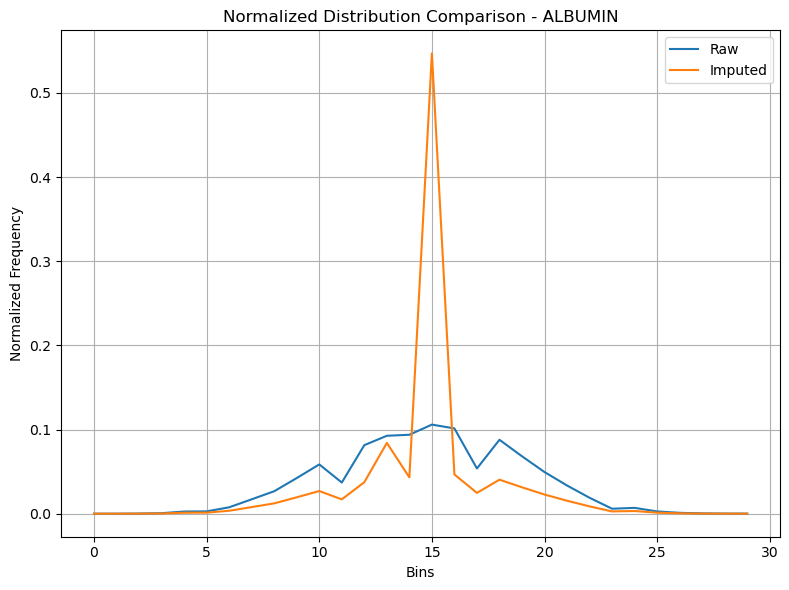

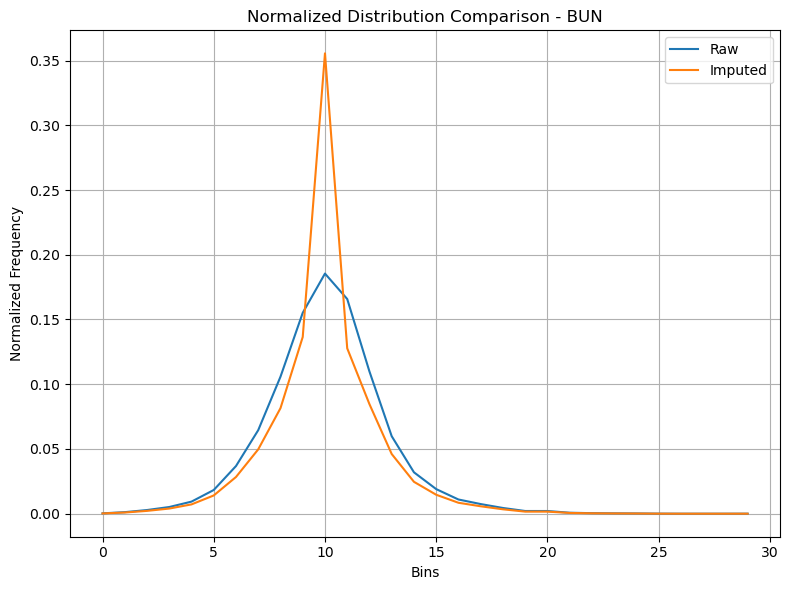

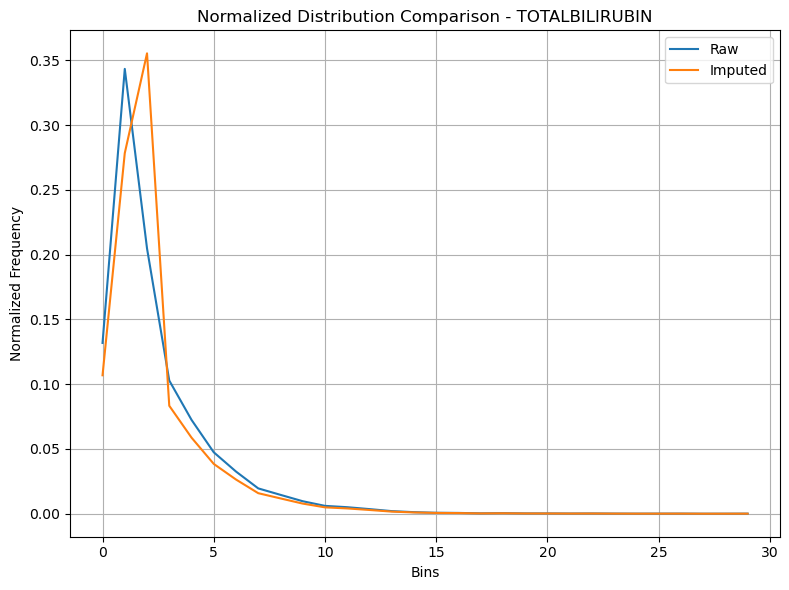

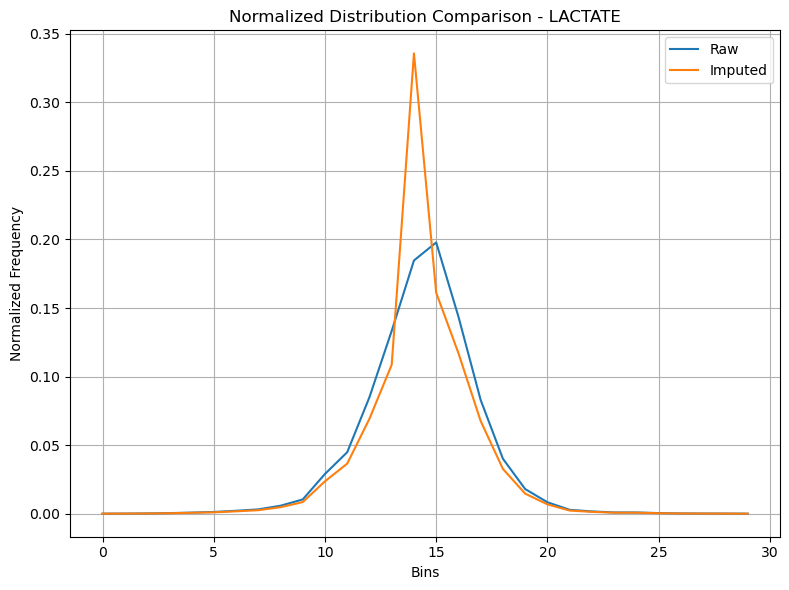

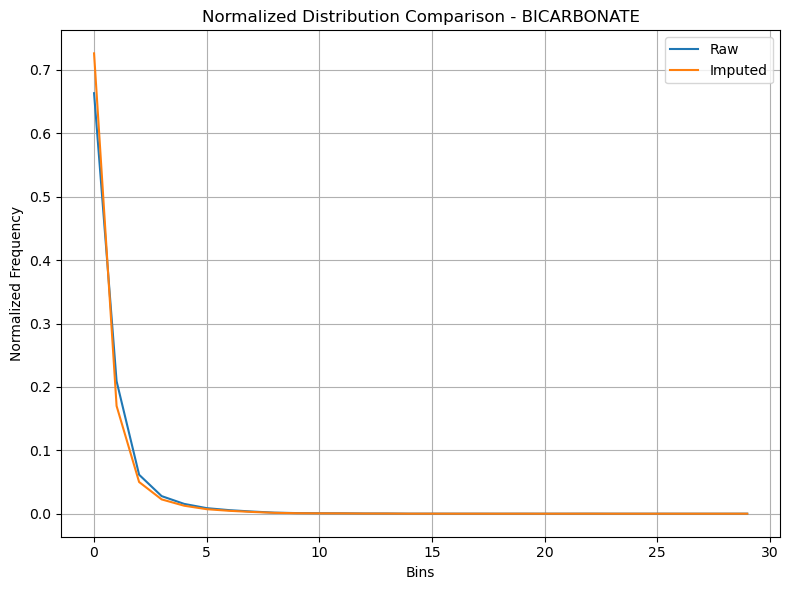

...

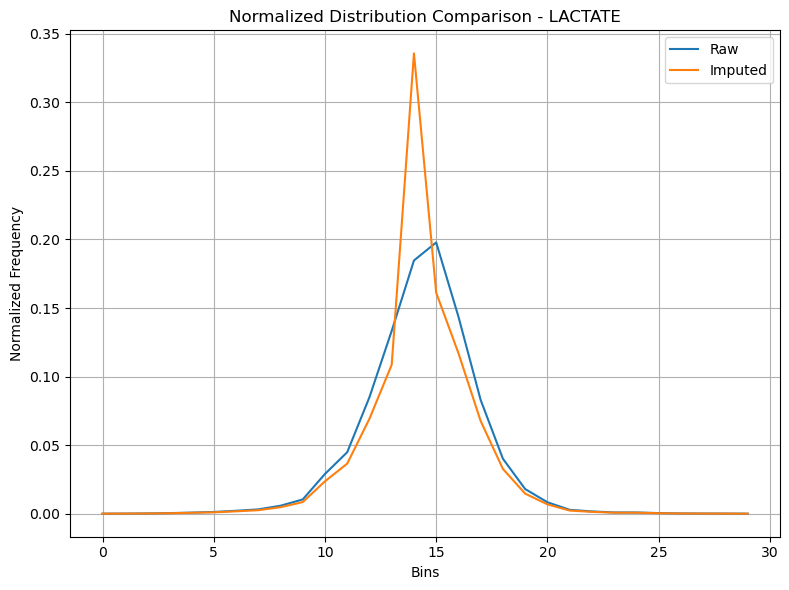

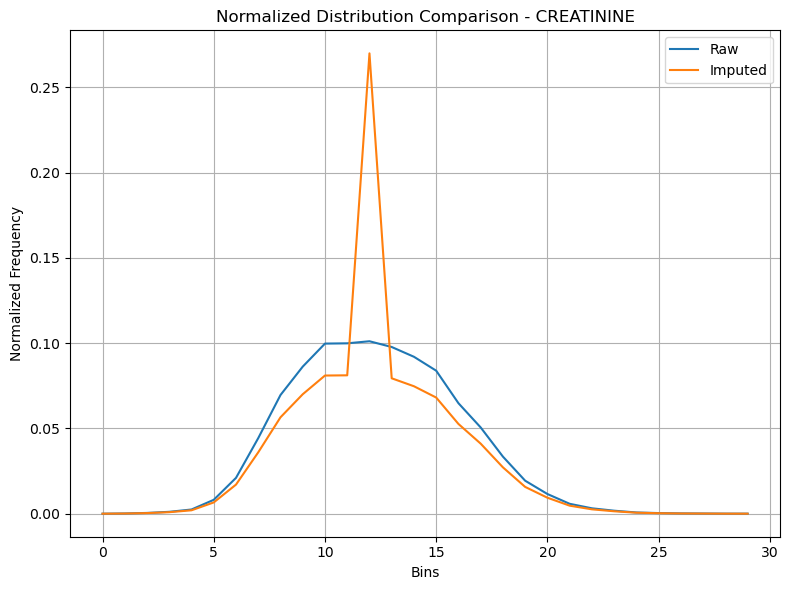

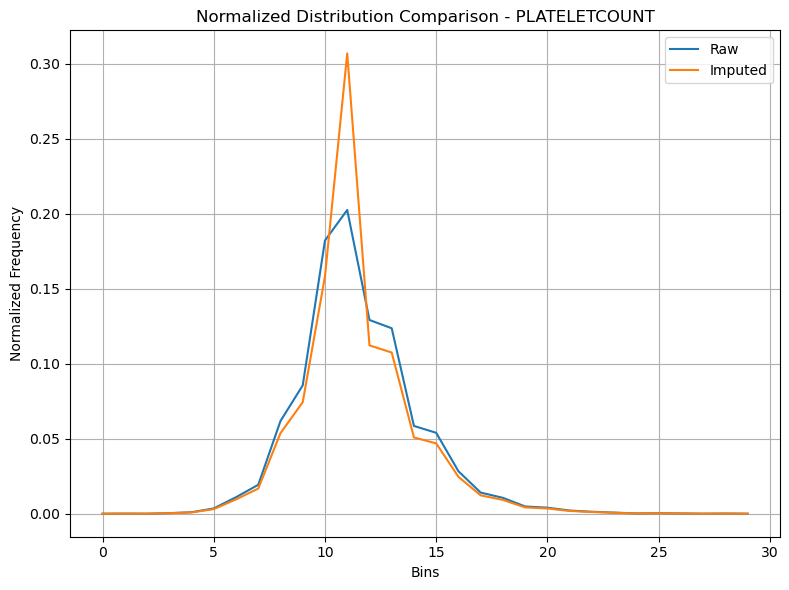

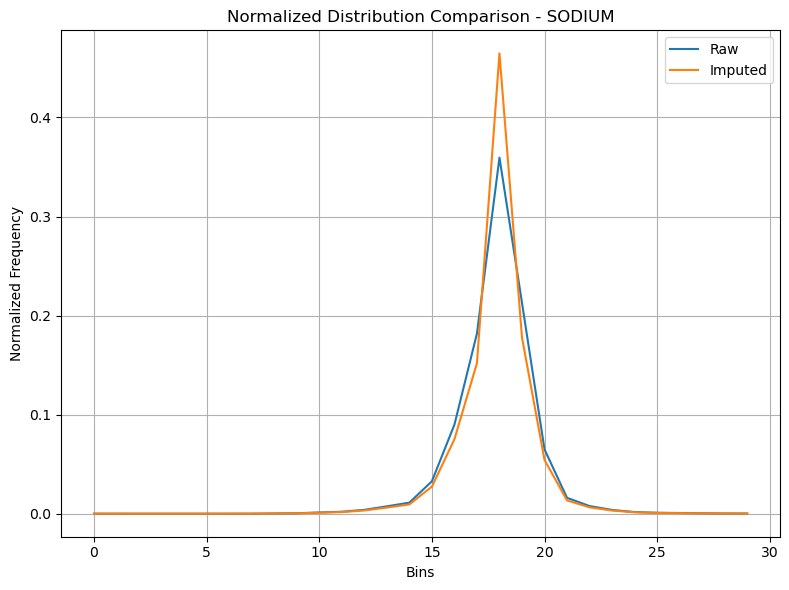

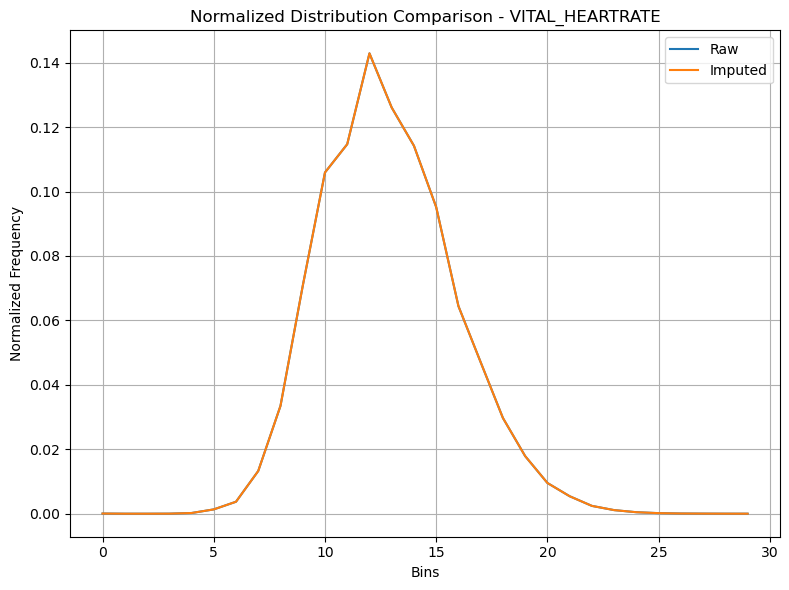

In [65]:
hist_raw = {} 
hist_combine = {}  

# Calculate histograms and normalize
for col in imputated_columns:
    hist_raw[col], _ = np.histogram(raw_df[col].dropna(), bins=30, density=True)
    hist_combine[col], _ = np.histogram(combine_df[col].dropna(), bins=30, density=True)
    hist_raw[col] = hist_raw[col] / np.sum(hist_raw[col])
    hist_combine[col] = hist_combine[col] / np.sum(hist_combine[col])

# Plotting separate graphs for each column
for col in imputated_columns:
    plt.figure(figsize=(8, 6))
    plt.plot(hist_raw[col], label='Raw')
    plt.plot(hist_combine[col], label='Imputed')
    plt.title(f'Normalized Distribution Comparison - {col}')
    plt.xlabel('Bins')
    plt.ylabel('Normalized Frequency')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [66]:
# Calculate KL Divergence

kl_divergences = {}

for col in imputated_columns:
    kl_divergences[col] = entropy(hist_raw[col], hist_combine[col])

# Print or analyze KL divergences
for col, kl_div in kl_divergences.items():
    print(f"KL Divergence for '{col}': {kl_div}")


KL Divergence for 'ALBUMIN': 0.4571392450935273
KL Divergence for 'BUN': 0.0712161908595466
KL Divergence for 'TOTALBILIRUBIN': 0.05407781121171435
KL Divergence for 'LACTATE': 0.05665005411998832
KL Divergence for 'BICARBONATE': 0.009516716649056485
KL Divergence for 'CHLORIDE': 0.013960972500148548
KL Divergence for 'CREATININE': 0.08763948427059473
KL Divergence for 'GLUCOSE': 0.08513557337745575
KL Divergence for 'HEMOGLOBIN': 0.32045300287499456
KL Divergence for 'HEMATOCRIT': 0.05320145602034673
KL Divergence for 'PLATELETCOUNT': 0.02771647784360831
KL Divergence for 'POTASSIUM': 0.3654642413689752
KL Divergence for 'PTT': 0.029590461607346116
KL Divergence for 'SODIUM': 0.022670237426574563
KL Divergence for 'WBCCOUNT': 0.011996746179329826
KL Divergence for 'VITAL_RESPIRATION': 0.0039967768338840465
KL Divergence for 'VITAL_SAO2': 0.00027558043573182485
KL Divergence for 'VITAL_TEMPERATURE': 0.2578865429021509
KL Divergence for 'VITAL_SYSTEMIC_SYSTOLIC': 0.6576749249986344
KL D

## Compute the Mahalanobis distance and detect outliers

In [68]:
def mahalanobis_distance(data):
    """
    Calculate the Mahalanobis distance for each data point.
    
    Parameters:
    data (pandas.DataFrame): Input data with shape (n_samples, n_features).
    
    Returns:
    mahalanobis_dist (numpy.ndarray): Array of Mahalanobis distances for each data point.
    """
    # Convert DataFrame to numpy array
    data_array = data.to_numpy()
    
    # Calculate mean vector
    mean_vector = np.mean(data_array, axis=0)
    
    # Calculate covariance matrix
    cov_matrix = np.cov(data_array, rowvar=False)
    
    # Invert the covariance matrix
    cov_inv = np.linalg.inv(cov_matrix)
    
    # Compute Mahalanobis distance for each data point
    diff = data_array - mean_vector
    mahalanobis_dist = np.sqrt(np.sum(np.dot(diff, cov_inv) * diff, axis=1))
    
    return mahalanobis_dist

def detect_outliers(data, threshold=0.95):
    """
    Detect outliers using Mahalanobis distance.
    
    Parameters:
    data (pandas.DataFrame): Input data with shape (n_samples, n_features).
    threshold (float): Threshold value to determine outliers based on chi-square distribution.
    
    Returns:
    outlier_indices (list): Indices of outlier data points.
    """
    # Calculate Mahalanobis distance
    mahalanobis_dist = mahalanobis_distance(data)
    
    # Calculate chi-square threshold value
    chi2_threshold = chi2.ppf(threshold, df=data.shape[1])
    
    # Identify outliers
    outlier_indices = np.where(mahalanobis_dist > chi2_threshold)[0]
    
    return outlier_indices

outlier_indices = detect_outliers(combine_df[num_cols])

# Print indices of outlier data points
print("Indices of outlier data points:", outlier_indices)

print("Outlier percentages (%): ", len(outlier_indices)/len(combine_df)*100)

Indices of outlier data points: [  13961   13969   13981   14008   14021   14028   28397   28425   28452
   29221   29233   29245   30026   30046   30058   73948   73997   74008
   84225   84239   84250  101702  101703  101704  101705  101706  101707
  101708  101709  101710  101711  101712  101713  101714  101715  101716
  101717  101718  101719  101720  101721  101722  101723  101724  101725
  109163  109184  116643  116645  116649  116650  116656  116666  116668
  116672  116673  116679  116689  116691  116695  116696  116698  116702
  159450  159464  159494  200532  200546  200557  200697  200717  200729
  203551  203582  241225  241236  241256  241267  247249  297096  297097
  297109  297112  297130  297131  297136  297140  303274  303277  307420
  307428  307448  307456  364130  364142  364184  364987  367886  367898
  367910  378082  378130  378144  423084  470321  470323  470324  470329
  470333  470334  470338  470339  470340  470350  470355  470356  470358
  470359  470362  4

In [69]:
combine_df.drop(outlier_indices, inplace=True)


In [70]:
missing_count = combine_df.isnull().sum()
missing_percentage = (missing_count / len(combine_df)) * 100

# Create a DataFrame to store the results
missing_data = pd.DataFrame({
    'Missing Count': missing_count,
    'Missing Percentage': missing_percentage
})

print(missing_data[missing_data["Missing Percentage"]>0])

Empty DataFrame
Columns: [Missing Count, Missing Percentage]
Index: []


# Data Transformation

In [72]:


# Separate the lab and vital signs data
lab_columns = ['ALBUMIN', 'BUN', 'TOTALBILIRUBIN', 'LACTATE', 'BICARBONATE', 'CHLORIDE', 'CREATININE', 'GLUCOSE', 'HEMOGLOBIN', 'HEMATOCRIT', 'PLATELETCOUNT', 'POTASSIUM', 'PTT', 'SODIUM', 'WBCCOUNT']
vital_columns = ['VITAL_HEARTRATE', 'VITAL_RESPIRATION', 'VITAL_SAO2', 'VITAL_TEMPERATURE', 'VITAL_SYSTEMIC_SYSTOLIC', 'VITAL_SYSTEMIC_DIASTOLIC', 'VITAL_SYSTEMIC_MEAN']

# Pivot lab data
lab_pivoted = combine_df.pivot_table(index=['PATIENTUNITSTAYID', 'UNIQUEPID', 'AGE', 'GENDER', 'ETHNICITY', 'UNITDISCHARGESTATUS'],
                                 columns='LAB_8HOURS',
                                 values=lab_columns,
                                 aggfunc='first')

# Pivot vital signs data
vital_pivoted = combine_df.pivot_table(index=['PATIENTUNITSTAYID', 'UNIQUEPID', 'AGE', 'GENDER', 'ETHNICITY', 'UNITDISCHARGESTATUS'],
                                   columns='VITAL_HOURS',
                                   values=vital_columns,
                                   aggfunc='first')

# Flatten the multi-level column index
lab_pivoted.columns = ['{}_{}'.format(col[0], col[1]) for col in lab_pivoted.columns]
vital_pivoted.columns = ['{}_{}'.format(col[0], col[1]) for col in vital_pivoted.columns]

# Reset the index to make them DataFrames
lab_pivoted = lab_pivoted.reset_index()
vital_pivoted = vital_pivoted.reset_index()

# Merge the two pivoted DataFrames
df = pd.merge(lab_pivoted, vital_pivoted, on=['PATIENTUNITSTAYID', 'UNIQUEPID', 'AGE', 'GENDER', 'ETHNICITY', 'UNITDISCHARGESTATUS'], how='outer')



In [73]:
df.head()

,PATIENTUNITSTAYID,UNIQUEPID,AGE,GENDER,ETHNICITY,UNITDISCHARGESTATUS,ALBUMIN_0.0,ALBUMIN_1.0,ALBUMIN_2.0,BICARBONATE_0.0,...,VITAL_TEMPERATURE_14.0,VITAL_TEMPERATURE_15.0,VITAL_TEMPERATURE_16.0,VITAL_TEMPERATURE_17.0,VITAL_TEMPERATURE_18.0,VITAL_TEMPERATURE_19.0,VITAL_TEMPERATURE_20.0,VITAL_TEMPERATURE_21.0,VITAL_TEMPERATURE_22.0,VITAL_TEMPERATURE_23.0
0,141233,002-8979,81,Female,Caucasian,Alive,3.024564,3.024564,3.024564,1.08,...,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2
1,141265,002-24408,67,Male,Caucasian,Alive,NaN,3.024564,3.024564,NaN,...,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2
2,141340,002-39247,80,Female,Caucasian,Alive,3.024564,3.024564,3.024564,1.58,...,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2
3,141360,002-34250,48,Male,Caucasian,Alive,4.100000,3.024564,NaN,1.31,...,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2
4,141362,002-66659,65,Male,Caucasian,Alive,4.400000,2.500000,NaN,1.11,...,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2,37.2


In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38563 entries, 0 to 38562
Columns: 219 entries, PATIENTUNITSTAYID to VITAL_TEMPERATURE_23.0
dtypes: float64(213), int32(1), int64(1), object(4)
memory usage: 64.3+ MB


In [75]:
df.describe()

,PATIENTUNITSTAYID,AGE,ALBUMIN_0.0,ALBUMIN_1.0,ALBUMIN_2.0,BICARBONATE_0.0,BICARBONATE_1.0,BICARBONATE_2.0,BUN_0.0,BUN_1.0,...,VITAL_TEMPERATURE_14.0,VITAL_TEMPERATURE_15.0,VITAL_TEMPERATURE_16.0,VITAL_TEMPERATURE_17.0,VITAL_TEMPERATURE_18.0,VITAL_TEMPERATURE_19.0,VITAL_TEMPERATURE_20.0,VITAL_TEMPERATURE_21.0,VITAL_TEMPERATURE_22.0,VITAL_TEMPERATURE_23.0
count,3.856300e+04,38563.000000,36844.000000,27382.000000,21133.000000,36844.000000,27382.000000,21133.000000,36844.000000,27382.000000,...,37963.000000,37943.000000,37923.000000,37915.000000,37920.000000,37939.000000,37951.000000,37973.000000,37984.000000,38001.000000
mean,1.822794e+06,64.614942,3.093998,2.929588,2.929472,1.617787,1.505979,1.477866,23.947942,23.514736,...,37.329465,37.327429,37.331176,37.327543,37.329507,37.329589,37.334071,37.332313,37.327018,37.330617
std,9.729132e+05,16.241487,0.603664,0.388059,0.341438,1.757978,1.468081,1.348091,5.045905,4.304181,...,3.316823,3.297628,3.307405,3.279225,3.274261,3.270253,3.309612,3.295494,3.231023,3.259149
min,1.412330e+05,11.000000,0.600000,0.200000,0.400000,0.100000,0.100000,0.100000,3.000000,3.500000,...,18.600000,14.550000,17.200000,19.600000,13.700000,21.600000,19.800000,11.100000,20.400000,21.050000
25%,1.063462e+06,55.000000,2.800000,3.000000,3.024564,0.810000,0.850000,0.970000,21.100000,22.000000,...,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000
50%,1.713092e+06,66.000000,3.024564,3.024564,3.024564,1.080000,1.080000,1.080000,23.825029,23.825029,...,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000
75%,2.773712e+06,77.000000,3.400000,3.024564,3.024564,1.632500,1.500000,1.380000,26.500000,25.000000,...,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000,37.200000
max,3.353190e+06,90.000000,5.700000,5.500000,5.500000,40.380000,31.320000,30.490000,63.000000,51.000000,...,103.600000,102.700000,102.600000,104.800000,106.050000,104.000000,102.850000,102.200000,102.200000,102.100000


In [76]:
missing_count = df.isnull().sum()
missing_percentage = (missing_count / len(df)) * 100

# Create a DataFrame to store the results
missing_data = pd.DataFrame({
    'Missing Count': missing_count,
    'Missing Percentage': missing_percentage
})

print(missing_data[(missing_data["Missing Percentage"]<15) & (missing_data["Missing Percentage"]> 10) ])

                              Missing Count  Missing Percentage
VITAL_HEARTRATE_0.0                    4021           10.427093
VITAL_RESPIRATION_0.0                  4021           10.427093
VITAL_SAO2_0.0                         4021           10.427093
VITAL_SYSTEMIC_DIASTOLIC_0.0           4021           10.427093
VITAL_SYSTEMIC_MEAN_0.0                4021           10.427093
VITAL_SYSTEMIC_SYSTOLIC_0.0            4021           10.427093
VITAL_TEMPERATURE_0.0                  4021           10.427093


In [77]:
columns_to_drop = missing_data[missing_data["Missing Percentage"] > 25].index
df_cleaned = df.drop(columns=columns_to_drop)


In [78]:
df_cleaned = df_cleaned.dropna()

In [79]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28976 entries, 0 to 38562
Columns: 189 entries, PATIENTUNITSTAYID to VITAL_TEMPERATURE_23.0
dtypes: float64(183), int32(1), int64(1), object(4)
memory usage: 41.9+ MB


In [80]:
missing_count = df_cleaned.isnull().sum()
missing_percentage = (missing_count / len(df_cleaned)) * 100

# Create a DataFrame to store the results
missing_data = pd.DataFrame({
    'Missing Count': missing_count,
    'Missing Percentage': missing_percentage
})

print(missing_data[missing_data["Missing Percentage"]>0 ])

Empty DataFrame
Columns: [Missing Count, Missing Percentage]
Index: []


##### Now, you have the cleaned dataset, your task is to establish your understanding on what ML tasks have been conducted on the similar extracted datasets. As a result, you will select one method of feature selection method, except SHAPRFECV and one method of feature reduction, except PCA to perform a classification task and make a lesson learned conclusion.

Use df to do ML:

    Feature Selection (Except SHAPRFECV):
    Method: Boruta
    Explanation: Boruta is a wrapper method that uses random forest models to identify important features. It works by creating shadow features (randomly permuted versions of the original features) and comparing the importance scores of real features to these shadow features. Features that consistently outperform their shadow counterparts are considered important.
    Feature Reduction (Except PCA - principla componnent analyse, ):
    Method: Linear Discriminant Analysis (LDA)
    Explanation: LDA, as discussed previously, projects data onto a lower-dimensional space while maximizing the separation between classes. It's a good choice when you have a clear distinction between classes and want to preserve information about class separation.
    Classification Task:
    Method: Logistic Regression
    Explanation: Logistic regression is a well-suited choice for binary classification problems and is often favored for its interpretability.

Step-by-Step Approach

    Prepare the Data:
    Load the cleaned eICU dataset (e.g., using Pandas in Python).
    Split the data into training and testing sets.
    Handle any remaining missing values or outliers (using the strategies discussed previously).
    Feature Selection with Boruta:
    Use the BorutaPy library (available on PyPI).
    Apply Boruta to your training data.
    Select the features marked as "important" by Boruta.
    Feature Reduction with LDA:
    Use the sklearn.discriminant_analysis library.
    Apply LDA to the training data, using the selected features from Boruta.
    Reduce the dimensionality of the data using the selected components.
    Train a Logistic Regression Model:
    Use the sklearn.linear_model library.
    Train the logistic regression model on the reduced training data (using the LDA components).
    Evaluate the Model:
    Evaluate the model on the testing set using appropriate metrics like accuracy, precision, recall, F1-score, and AUC.
